# Collected dataset: Data loading, labelling and processing

This notebook contains the data labelling and processing procedures applied to the collected dataset. The data collection is described in `01_DATA/03_COLLECTED-DATASET/README.md`.

- Input:
  - `01_DATA/03_COLLECTED-DATASET/01_RAW/01_dataset.csv`: the raw dataset. It is composed by 4 datasets.
  - `01_DATA/03_COLLECTED-DATASET/01_RAW/02_segments-D1.csv`: data used to segment the activities performed in the first dataset (_D1_).
  - `01_DATA/03_COLLECTED-DATASET/01_RAW/02_segments-D2.csv`: data used to segment the activities performed in the second dataset (_D2_).
  - `01_DATA/03_COLLECTED-DATASET/01_RAW/02_segments-D3.csv`: data used to segment the activities performed in the third dataset (_D3_).
  - `01_DATA/03_COLLECTED-DATASET/01_RAW/02_segments-D4.csv`: data used to segment the activities performed in the fourth dataset (_D4_).
- Output:
  - `01_DATA/03_COLLECTED-DATASET/02_LABELLED/`: for each dataset, a subdirectory contains the labelled data, organized by executions.
  - `01_DATA/03_COLLECTED-DATASET/03_WINDOWED/`: for each dataset, a subdirectory contains the windowed (size=50, overlap=50%) data, organized by executions.

## Imports

In [1]:
import copy
import os
import datetime as dt

import numpy as np
import pandas as pd
import plotly.graph_objects as go

from math import sqrt

from alive_progress import alive_bar
from plotly.subplots import make_subplots
from scipy.interpolate import interp1d  

from functions.filters import dbscan_filtering, wavelet_filtering

## Constants

In [2]:
DATA_DIR = '01_DATA'

COLLECTED_DATASET_DIR = os.path.join(DATA_DIR, '03_COLLECTED-DATASET')
AMPLITUDES_HEATMAP = os.path.join(COLLECTED_DATASET_DIR, 'amplitudes-heatmap.pdf')

RAW_DATA_DIR = os.path.join(COLLECTED_DATASET_DIR, '01_RAW')
DATASET = '01_dataset.csv'
SEGMENTS_D1 = '02_segments-D1.csv'
SEGMENTS_D2 = '02_segments-D2.csv'
SEGMENTS_D3 = '02_segments-D3.csv'
SEGMENTS_D4 = '02_segments-D4.csv'

LABELLED_DATA_DIR = os.path.join(COLLECTED_DATASET_DIR, '02_LABELLED')
LABELLED_D1_DIR = os.path.join(LABELLED_DATA_DIR, 'D1')
LABELLED_D2_DIR = os.path.join(LABELLED_DATA_DIR, 'D2')
LABELLED_D3_DIR = os.path.join(LABELLED_DATA_DIR, 'D3')
LABELLED_D4_DIR = os.path.join(LABELLED_DATA_DIR, 'D4')

WINDOWED_DATA_DIR = os.path.join(COLLECTED_DATASET_DIR, '03_WINDOWED')
WINDOWED_D1_DIR = os.path.join(WINDOWED_DATA_DIR, 'D1')
WINDOWED_D2_DIR = os.path.join(WINDOWED_DATA_DIR, 'D2')
WINDOWED_D3_DIR = os.path.join(WINDOWED_DATA_DIR, 'D3')
WINDOWED_D4_DIR = os.path.join(WINDOWED_DATA_DIR, 'D4')

X_FILE_PATTERN = '{0}-x.npy'
Y_FILE_PATTERN = '{0}-y.npy'

SUBCARRIERS_INDEXES = np.append(np.arange(-28, 0), np.arange(1, 29))
SUBCARRIERS_INDEXES_FULL = np.arange(-32,32)

LABELS = ['SEATED_RX','STANDING_UP_RX','WALKING_TX','TURN_TX','SITTING_DOWN_TX', 'SEATED_TX', 'STANDING_UP_TX','WALKING_RX','TURN_RX','SITTING_DOWN_RX']

## Functions

### Data Loading

#### Raw data

In [3]:
def load_dataset(data_path_dir, dataset_file):
    dataset_path = os.path.join(data_path_dir, dataset_file)
    data = pd.read_csv(dataset_path, on_bad_lines='warn')
    
    for i in range(1, len(data)): # Due to NTP periodic syncing, some samples have lower timestamps than previous collected samples
        prev = data.loc[i - 1, 'pc_timestamp']
        curr = data.loc[i, 'pc_timestamp']
        if prev > curr:
            data.loc[i, 'pc_timestamp'] = prev
            
    data['timestamp'] = data['pc_timestamp'].apply(lambda x : dt.datetime.fromtimestamp(x))
    data = data.set_index(['timestamp'])
    return data


def load_segments(data_path_dir, segments_file):
    segments_path = os.path.join(data_path_dir, segments_file)
    segments = pd.read_csv(segments_path, converters={'phase': lambda x: x.strip()})
    segments = segments.set_index(['execution', 'phase'])
    return segments


def datetime_from(execution):
    return dt.datetime(
        execution.year,
        execution.month,
        execution.day,
        execution.hour,
        execution.minute,
        execution.second, 
        execution.ms * 1000,
    )


def split_by_executions(data, segments):
    executions = {}
    for execution_id in segments.index.levels[0]:
        execution_segments = segments.loc[execution_id]
        start = datetime_from(execution_segments.loc['start'])
        end = datetime_from(execution_segments.loc['end'])
        executions[execution_id] = data[start:end]
    return executions

#### Subcarriers

In [4]:
def raw_values_to_amplitude(csi_values):
    amplitudes = []
    phases = []
    for i in range(0, len(csi_values), 2):
        imaginary = int(csi_values[i])
        real = int(csi_values[i+1])
        
        amplitudes.append(sqrt(imaginary ** 2 + real ** 2))
    return amplitudes


def signal_reorderer(keep_null_subcarriers):
    def without_null(signal):
        return np.append(signal[36:], signal[1:29])
    def with_null(signal):
        return np.append(signal[32:], signal[0:32])
    return with_null if keep_null_subcarriers else without_null

#### Resampling

In [5]:
def resample(signals, old_timestamps, new_timestamps, kind):
    F = interp1d(old_timestamps, signals, fill_value='extrapolate', kind=kind) 
    return F(new_timestamps)


def resample_data(amplitude, timestamps, kind='linear'):
    new_timestamps = np.arange(timestamps.min(), timestamps.max(), 0.01)

    resampled_amplitude_matrix = np.apply_along_axis(lambda x: resample(x, timestamps, new_timestamps, kind), 1, amplitude)
    return resampled_amplitude_matrix, new_timestamps

In [6]:
def to_matrix(df, keep_null_subcarriers):
    amplitudes_matrix = []
    timestamps_matrix = []
    reorderer = signal_reorderer(keep_null_subcarriers)
    for index, row in df.iterrows():
        rssi = row['rssi']
        csi_data = row['data'][1:-1].split(',')
        timestamp = row['pc_timestamp']

        amplitudes = raw_values_to_amplitude(csi_data)
        if len(amplitudes) != 64:
            print(f'Uncomplete csi data in {index}')
            continue
        amplitudes_matrix.append(reorderer(amplitudes))
        timestamps_matrix.append(timestamp)
    return np.array(amplitudes_matrix).T, np.array(timestamps_matrix)


def df_to_resampled_matrix(data):
    amplitudes_matrixes = {}
    timestamps_matrixes = {}
    executions_ids = data.keys()
    with alive_bar(len(executions_ids), title=f'Resampling executions', force_tty=True) as progress_bar:
        for execution_id in executions_ids:
            execution = data[execution_id]
            amplitudes, timestamps = to_matrix(execution, keep_null_subcarriers=False)
            amplitudes, timestamps = resample_data(amplitudes, timestamps)
            amplitudes_matrixes[execution_id] = amplitudes
            timestamps_matrixes[execution_id] = timestamps
            progress_bar()
    return amplitudes_matrixes, timestamps_matrixes

### Data Labelling

In [7]:
def create_labels(timestamps, segments):
    labels = pd.Series(timestamps, name='timestamp').to_frame()
    labels['label'] = 'None'
    labels['timestamp'] = labels['timestamp'].apply(lambda x : dt.datetime.fromtimestamp(x))
    labels = labels.set_index(['timestamp'])
    
    for key, execution in segments.groupby(level=0):
        key_parts = key.split('_')
        start_from, end_in = key_parts[1].upper(), key_parts[2].upper()
        
        start = datetime_from(execution.loc[(key,'start')])
        stand_start = datetime_from(execution.loc[(key,'standing_start')])
        stand_end = datetime_from(execution.loc[(key,'standing_end')])
        turn_start = datetime_from(execution.loc[(key,'turn_start')])
        turn_end = datetime_from(execution.loc[(key,'turn_end')])
        sit_end = datetime_from(execution.loc[(key,'sitting_end')])
        end = datetime_from(execution.loc[(key,'end')])

        labels.loc[start:stand_start,'label'] = f'SEATED_{start_from}'
        labels.loc[stand_start:stand_end,'label'] = f'STANDING_UP_{start_from}'
        labels.loc[stand_end:turn_start,'label'] = f'WALKING_{end_in}'
        labels.loc[turn_start:turn_end,'label'] = f'TURN_{end_in}'
        labels.loc[turn_end:sit_end,'label'] = f'SITTING_DOWN_{end_in}'
        labels.loc[sit_end:end,'label'] = f'SEATED_{end_in}'
    return labels


def obtain_labels(segments, timestamps_matrixes):
    labels = {}
    for execution_id, timestamps in timestamps_matrixes.items():
        labels[execution_id] = create_labels(timestamps, segments)
    return labels


def count_labels(executions_labels):
    dfs = []
    for i, execution_labels in enumerate(executions_labels):
        recount = dict(zip(LABELS, [0] * len(LABELS)))

        for labels in execution_labels.values():
            count = labels['label'].value_counts()
            for key, value in count.items():
                recount[key] += value
        dfs.append(pd.DataFrame(recount.values(), index=recount.keys(), columns=[f'D{i+1}']))
    df = pd.concat(dfs, axis=1)
    df.loc['Total',:] = df.sum(axis=0)
    return df

### Data windowing

In [8]:
def create_windows(executions_amplitudes, executions_labels, window_size=50, window_overlap=25):
    win = {}
    win_labels = {}
    for execution_id in executions_amplitudes:
        amplitudes = executions_amplitudes[execution_id]
        exec_labels = executions_labels[execution_id]

        data = amplitudes
        n = data.shape[1] // window_overlap

        windows = []
        windows_labels = []
        for i in range(0, (n-1) * window_overlap, window_overlap):
            if i+window_size > data.shape[1]:
                break
            window_labels = exec_labels[i:i+window_size]
            values, counts = np.unique(window_labels, return_counts=True)
            if len(values) != 1:
                continue
            windows.append(data[:,i:i+window_size])
            windows_labels.append(values[counts.argmax()])

        windows = np.array(windows)
        windows_labels = np.array(windows_labels)

        win[execution_id] = windows
        win_labels[execution_id] = windows_labels
    return win, win_labels


def process_windows(executions_windows):
    windows_copy = copy.deepcopy(executions_windows)
    executions_ids = windows_copy.keys()
    with alive_bar(len(executions_ids), title=f'Processing windows', force_tty=True) as progress_bar:
        for execution_id in windows_copy:
            windows = windows_copy[execution_id]
            for window in windows:
                window = np.apply_along_axis(lambda x: wavelet_filtering(dbscan_filtering(x)),1, window)
            progress_bar()
    return windows_copy

### Store

In [9]:
def save(data, labels, directory, x_file_pattern, y_file_pattern):
    x_file_path = os.path.join(directory, x_file_pattern)
    y_file_path = os.path.join(directory, y_file_pattern)

    for execution_id in data:
        x = data[execution_id]
        y = labels[execution_id]

        np.save(x_file_path.format(execution_id), x)
        np.save(y_file_path.format(execution_id), y)
        

def save_labelled_data(executions, labels, directory):
    save(executions, labels, directory, X_FILE_PATTERN, Y_FILE_PATTERN)
    

def save_windowed_data(windows, labels, directory):
    save(windows, labels, directory, X_FILE_PATTERN, Y_FILE_PATTERN)

### Visualization

In [10]:
def plot_amplitudes_heatmap(data, sequences, apply_preprocessing=False, keep_null_subcarriers=True):
    fig = make_subplots(rows=len(sequences), cols=1, shared_xaxes=False, vertical_spacing=0.15, y_title='<b>Subcarrier index</b>')
    fig.update_annotations(font_size=20) # To change font size of y_title
    
    actions = ["SEATED_RX", "STANDING_UP_RX", "WALKING_TX", "TURN_TX", "SITTING_DOWN_TX",
               "SEATED_TX", "STANDING_UP_TX", "WALKING_RX", "TURN_RX", "SITTING_DOWN_RX", "SEATED_RX"]
    
    for i, sequence in enumerate(sequences):
        start = datetime_from(sequence['go'].loc['start'])
        end = datetime_from(sequence['back'].loc['end'])
        
        sequence_data = data.loc[start:end]
        
        amplitudes, timestamps = to_matrix(sequence_data, keep_null_subcarriers)
        x = timestamps
        y = SUBCARRIERS_INDEXES_FULL if keep_null_subcarriers else SUBCARRIERS_INDEXES
        if apply_preprocessing:
            amplitudes, new_timestamps = resample_data(amplitudes, timestamps)
            amplitudes = np.apply_along_axis(lambda x: wavelet_filtering(dbscan_filtering(x)),1, amplitudes)
            x = new_timestamps
        
        fig.add_trace(
            go.Heatmap(
                z=amplitudes,
                x=x,
                y=y,
                coloraxis = "coloraxis",
            ),
            row=i+1, col=1
        )
        
        boundaries = []
        for boundary in list(sequence['go'].index):
            if boundary == 'end':
                continue
            boundaries.append(datetime_from(sequence['go'].loc[boundary]).timestamp())
        for boundary in list(sequence['back'].index):
            if boundary == 'start':
                continue
            boundaries.append(datetime_from(sequence['back'].loc[boundary]).timestamp())    
        
        for j, boundary in enumerate(boundaries):
            fig.add_vline(
                x=boundary, line_width=3, line_dash="dash", line_color="green",
                row=i+1, col=1
            )
            
            if j != len(boundaries) - 1:
                arangement = { "position": 'bottom', "yoffset": -25 } if j % 2 == 0 else { "position": 'top', "yoffset": 25 }
                color = 'green' if i % 2 == 0 else 'blue'
            
                fig.add_vrect(
                    x0=boundary, x1=boundaries[j+1],
                    fillcolor='white', opacity=0,
                    layer="below", line_width=0,
                    annotation_text=f'<b>{actions[j]}</b>', annotation_font_size=13, annotation_font_color='white',
                    annotation_position=arangement['position'], annotation_xanchor='center', annotation_yshift=arangement['yoffset'], annotation_bordercolor='black', annotation_bgcolor=color,
                    row=i+1, col=1
                )

    fig.update_layout(height=550, width=1400, legend_title_text='Amplitude')
    fig.update_xaxes(visible=False, showticklabels=False)
    fig.layout.coloraxis.colorbar.title = {'text': "<b>Amplitude</b>", 'font': {'size': 16}}
    return fig

## Pipeline execution

### Data loading

- Load the data and the information for segmentation.
- Split the dataset into the four datasets.
- Resample data to 100 Hz.

In [11]:
dataset = load_dataset(RAW_DATA_DIR, DATASET)
segments_d1 = load_segments(RAW_DATA_DIR, SEGMENTS_D1)
segments_d2 = load_segments(RAW_DATA_DIR, SEGMENTS_D2)
segments_d3 = load_segments(RAW_DATA_DIR, SEGMENTS_D3)
segments_d4 = load_segments(RAW_DATA_DIR, SEGMENTS_D4)

In [12]:
d1_executions = split_by_executions(dataset, segments_d1)
d2_executions = split_by_executions(dataset, segments_d2)
d3_executions = split_by_executions(dataset, segments_d3)
d4_executions = split_by_executions(dataset, segments_d4)

In [13]:
d1_executions_amp, d1_executions_timestamps = df_to_resampled_matrix(d1_executions)
d2_executions_amp, d2_executions_timestamps = df_to_resampled_matrix(d2_executions)
d3_executions_amp, d3_executions_timestamps = df_to_resampled_matrix(d3_executions)
d4_executions_amp, d4_executions_timestamps = df_to_resampled_matrix(d4_executions)

Resampling executions |████████████████████████████████████████| 20/20 [100%] in 1.5s (13.12/s)                         
Resampling executions |████████████████████████████████████████| 4/4 [100%] in 0.4s (8.98/s)                            
Resampling executions |████████████████████████████████████████| 4/4 [100%] in 0.4s (8.69/s)                            
Resampling executions |████████████████████████████████████████| 4/4 [100%] in 0.4s (8.57/s)                            


#### Visualization

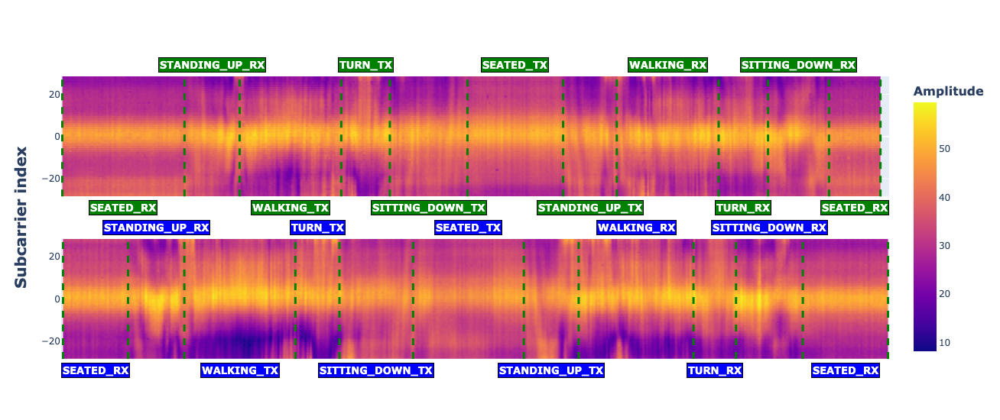

In [14]:
sequences = [
    {
        "go": segments_d1.loc['e01_rx_tx'],
        "back": segments_d1.loc['e01_tx_rx']
    },
    {
        "go": segments_d4.loc['e02_rx_tx'],
        "back": segments_d4.loc['e02_tx_rx']
    },
]

fig = plot_amplitudes_heatmap(dataset, sequences, apply_preprocessing=True, keep_null_subcarriers=False)
fig

The above plot corresponds with the **Figure 7** of the paper.

In [15]:
fig.write_image(AMPLITUDES_HEATMAP)

### Data labelling

- Label each sample accordingly to the activity that the user was performing. Activities:
  - _seated_rx_
  - _standing_up_rx_
  - _walking_tx_
  - _turn_tx_
  - _sitting_down_tx_
  - _seated_tx_
  - _standing_up_tx_
  - _walking_rx_
  - _turn_rx_
  - _sitting_down_rx_
- Labelled data stored in: `01_DATA/03_COLLECTED-DATASET/02_LABELLED/D{1|2|3|4}`

In [16]:
d1_labels = obtain_labels(segments_d1, d1_executions_timestamps)
d2_labels = obtain_labels(segments_d2, d2_executions_timestamps)
d3_labels = obtain_labels(segments_d3, d3_executions_timestamps)
d4_labels = obtain_labels(segments_d4, d4_executions_timestamps)

In [17]:
labels_count = count_labels([d1_labels, d2_labels, d3_labels, d4_labels])
labels_count

,D1,D2,D3,D4
SEATED_RX,2864.0,614.0,593.0,569.0
STANDING_UP_RX,1305.0,293.0,276.0,269.0
WALKING_TX,2285.0,455.0,466.0,469.0
TURN_TX,1133.0,222.0,238.0,208.0
SITTING_DOWN_TX,1538.0,351.0,301.0,315.0
SEATED_TX,2890.0,415.0,504.0,499.0
STANDING_UP_TX,1289.0,291.0,271.0,267.0
WALKING_RX,2470.0,503.0,504.0,510.0
TURN_RX,997.0,194.0,228.0,175.0
SITTING_DOWN_RX,1524.0,353.0,304.0,301.0


The above table corresponds with the **Table II** of the paper

In [ ]:
save_labelled_data(d1_executions_amp, d1_labels, LABELLED_D1_DIR)
save_labelled_data(d2_executions_amp, d2_labels, LABELLED_D2_DIR)
save_labelled_data(d3_executions_amp, d3_labels, LABELLED_D3_DIR)
save_labelled_data(d4_executions_amp, d4_labels, LABELLED_D4_DIR)

### Data processing

- Create windows of 50 samples (0.5 seconds) and a 50% overlap
- Process windows to remove noise:
  - DBSCAN filter to remove outliers.
  - Wavelet-based filtering to remove noise.
- Windows stored in: `01_DATA/03_COLLECTED-DATASET/03_WINDOWED/D{1|2|3|4}`

In [18]:
d1_windows, d1_windows_labels = create_windows(d1_executions_amp, d1_labels)
d2_windows, d2_windows_labels = create_windows(d2_executions_amp, d2_labels)
d3_windows, d3_windows_labels = create_windows(d3_executions_amp, d3_labels)
d4_windows, d4_windows_labels = create_windows(d4_executions_amp, d4_labels)

In [19]:
d1_windows_processed = process_windows(d1_windows)
d2_windows_processed = process_windows(d2_windows)
d3_windows_processed = process_windows(d3_windows)
d4_windows_processed = process_windows(d4_windows)

Processing windows |████████████████████████████████████████| 20/20 [100%] in 10.1s (1.95/s)                            
Processing windows |████████████████████████████████████████| 4/4 [100%] in 2.3s (1.60/s)                               
Processing windows |████████████████████████████████████████| 4/4 [100%] in 2.2s (1.61/s)                               
Processing windows |████████████████████████████████████████| 4/4 [100%] in 2.0s (1.75/s)                               


In [ ]:
save_windowed_data(d1_windows_processed, d1_windows_labels, WINDOWED_D1_DIR)
save_windowed_data(d2_windows_processed, d2_windows_labels, WINDOWED_D2_DIR)
save_windowed_data(d3_windows_processed, d3_windows_labels, WINDOWED_D3_DIR)
save_windowed_data(d4_windows_processed, d4_windows_labels, WINDOWED_D4_DIR)